# 라이브러리 설정

In [79]:
import json, os, random, shutil, platform, yaml
from collections import Counter, defaultdict

import cv2, numpy as np, pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image, ImageDraw, ImageFont

import torch, torchvision
from torch.utils.data import Dataset, DataLoader, random_split
from torchvision import transforms
from torchvision.transforms.functional import to_pil_image
import albumentations as A
from albumentations.pytorch import ToTensorV2

# 디바이스 설정

In [4]:
# 재현성
def set_seed(seed=42):
    random.seed(seed); np.random.seed(seed)
    torch.manual_seed(seed); torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = False
    torch.backends.cudnn.benchmark = True  # 이미지엔 대체로 이게 빠름

set_seed()

In [5]:
# 디바이스 설정
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("device: ", device)

device:  cpu


# 데이터 확인

In [9]:
!kaggle competitions download -c ai04-level1-project

 99% 3.86G/3.91G [00:56<00:02, 27.2MB/s]
100% 3.91G/3.91G [00:56<00:00, 74.1MB/s]


In [10]:
# data 폴더가 없다면 먼저 생성
!mkdir -p /data

# 다운로드된 zip 파일을 /data 폴더에 압축 해제
!unzip -q /content/ai04-level1-project.zip -d /data

In [48]:
# 경로설정
data_dir = '/data'
annotations_dir = os.path.join(data_dir, 'train_annotations')
train_dir = os.path.join(data_dir, 'train_images')
test_dir = os.path.join(data_dir, 'test_images')

# 이미지 파일 목록
train_images = [f for f in os.listdir(train_dir) if f.endswith('.png')]
print('이미지 개수:', len(train_images))
print('샘플 3개:', train_images[:3])

# 어노테이션 파일 목록
json_files = []
for root, dirs, files in os.walk(annotations_dir):
    for file in files:
        if file.endswith('.json'):
            json_files.append(os.path.join(root, file))
print('어노테이션 파일 개수:', len(json_files))
print('샘플 3개:', json_files[:3])

# json 하나 열어서 구조 확인
with open(json_files[0], 'r', encoding='utf-8') as f:
    data = json.load(f)

print('keys:', data.keys())
print('이미지 수:', len(data['images']))
print('어노테이션 수:', len(data['annotations']))
print('카테고리 수:', len(data['categories']))

# 카테고리 이름(unique class) 확인
categories = pd.DataFrame(data['categories'])
print('유니크 클래스 개수:', categories.shape[0])
print('클래스 이름 예시:', categories.head())

이미지 개수: 1489
샘플 3개: ['K-003351-020014-020238_0_2_0_2_90_000_200.png', 'K-003483-025367-025469-035206_0_2_0_2_70_000_200.png', 'K-003544-004543-016548-027993_0_2_0_2_90_000_200.png']
어노테이션 파일 개수: 4526
샘플 3개: ['/data/train_annotations/K-003544-010221-016548-033009_json/K-003544/K-003544-010221-016548-033009_0_2_0_2_75_000_200.json', '/data/train_annotations/K-003544-010221-016548-033009_json/K-003544/K-003544-010221-016548-033009_0_2_0_2_90_000_200.json', '/data/train_annotations/K-003544-010221-016548-033009_json/K-003544/K-003544-010221-016548-033009_0_2_0_2_70_000_200.json']
keys: dict_keys(['images', 'type', 'annotations', 'categories'])
이미지 수: 1
어노테이션 수: 1
카테고리 수: 1
유니크 클래스 개수: 1
클래스 이름 예시:   supercategory    id               name
0          pill  3543  무코스타정(레바미피드)(비매품)


## 클래스 개수 및 bbox 평균

In [70]:
all_classes = []
all_boxes = []

for jf in json_files:
    with open(jf, 'r', encoding='utf-8') as f:
        data = json.load(f)

    # 카테고리 정보
    for cat in data['categories']:
        all_classes.append(cat['name'])

    # 바운딩 박스 정보
    for ann in data['annotations']:
        if 'bbox' in ann and len(ann['bbox']) == 4:
            all_boxes.append(ann['bbox'])


# 클래스 분포
unique_classes = list(set(all_classes))
cls_counter = Counter(all_classes)

print('상위 10개 클래스:', cls_counter.most_common(10))

# 바운딩 박스 크기 분포
widths = [b[2] for b in all_boxes]
heights = [b[3] for b in all_boxes]
print('bbox 평균 크기:', np.mean(widths), np.mean(heights))

상위 10개 클래스: [('기넥신에프정(은행엽엑스)(수출용)', 514), ('일양하이트린정 2mg', 240), ('보령부스파정 5mg', 180), ('뮤테란캡슐 100mg', 172), ('가바토파정 100mg', 143), ('동아가바펜틴정 800mg', 139), ('아토젯정 10/40mg', 113), ('리바로정 4mg', 111), ('리피토정 20mg', 109), ('크레스토정 20mg', 108)]
bbox 평균 크기: 259.326557666814 288.7459125055236


In [25]:
# 한글 오류 제거 코드
!sudo apt-get install -y fonts-nanum
!sudo fc-cache -fv
!rm ~/.cache/matplotlib -rf

!apt-get update -qq
!apt-get install fonts-nanum* -qq

import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
import warnings
warnings.filterwarnings(action='ignore')

path = '/usr/share/fonts/truetype/nanum/NanumBarunGothic.ttf' # 나눔 고딕
font_name = fm.FontProperties(fname=path, size=10).get_name() # 기본 폰트 사이즈 : 10
plt.rc('font', family=font_name)

fm.fontManager.addfont(path)

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following NEW packages will be installed:
  fonts-nanum
0 upgraded, 1 newly installed, 0 to remove and 35 not upgraded.
Need to get 10.3 MB of archives.
After this operation, 34.1 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 fonts-nanum all 20200506-1 [10.3 MB]
Fetched 10.3 MB in 2s (5,484 kB/s)
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/Debconf/FrontEnd/Dialog.pm line 78, <> line 1.)
debconf: falling back to frontend: Readline
debconf: unable to initialize frontend: Readline
debconf: (This frontend requires a controlling tty.)
debconf: falling back to frontend: Teletype
dpkg-preconfigure: unable to re-open stdin: 
Selecting previously unselected package fonts-nanum.
(Reading database ... 126374 files and dire

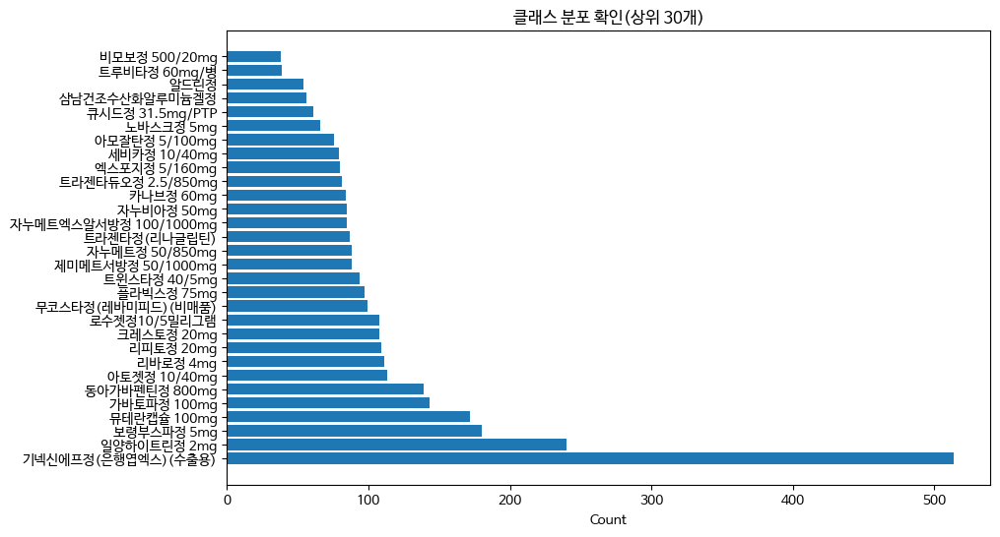

In [40]:
# 클래스 분포 확인(상위 30개)
top_classes = cls_counter.most_common(30)
names, counts = zip(*top_classes)

plt.figure(figsize=(10,6))
plt.barh(names, counts)
plt.xlabel('Count')
plt.title('클래스 분포 확인(상위 30개)')
plt.show()

## Image Uniqu size 확인

In [23]:
sizes = []
for f in os.listdir(train_dir):
    if f.endswith('.png'):
        path = os.path.join(train_dir, f)
        with Image.open(path) as img:
            sizes.append(img.size)  # (width, height)

# 유니크한 사이즈 종류
unique_sizes = Counter(sizes)

print('총 이미지 개수:', len(sizes))
print('유니크 사이즈 개수:', len(unique_sizes))
print('상위 10개 사이즈:', unique_sizes.most_common(10))

총 이미지 개수: 1489
유니크 사이즈 개수: 1
상위 10개 사이즈: [((976, 1280), 1489)]


## bbox 시각화

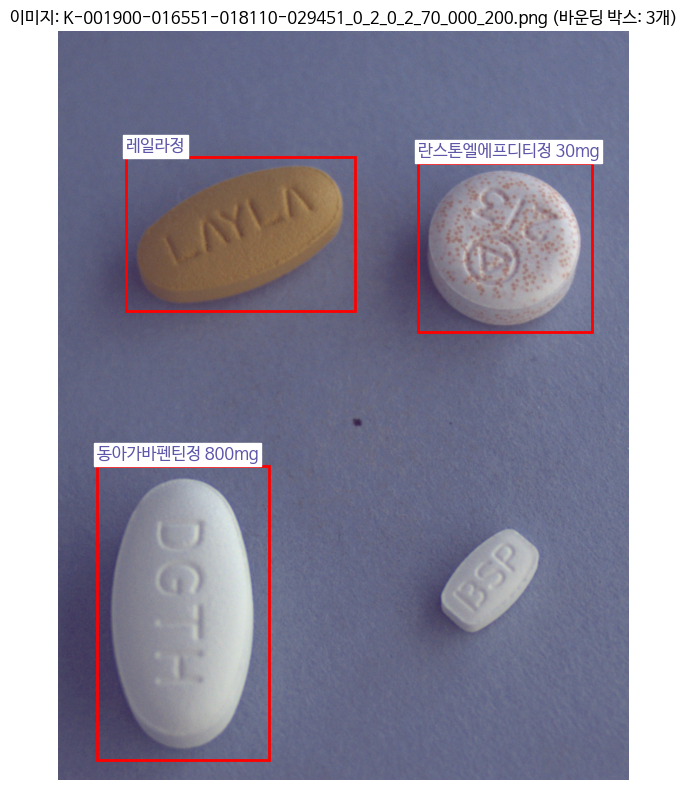

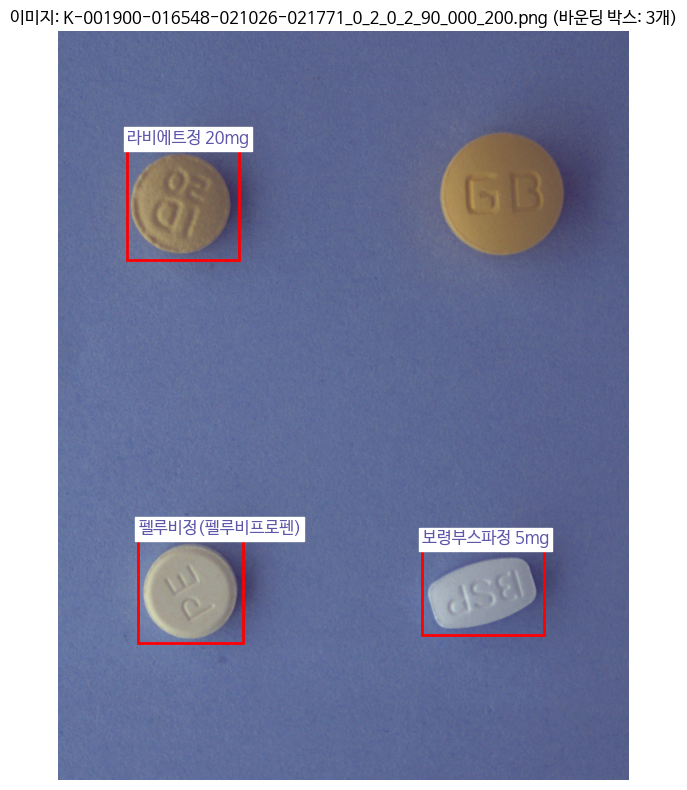

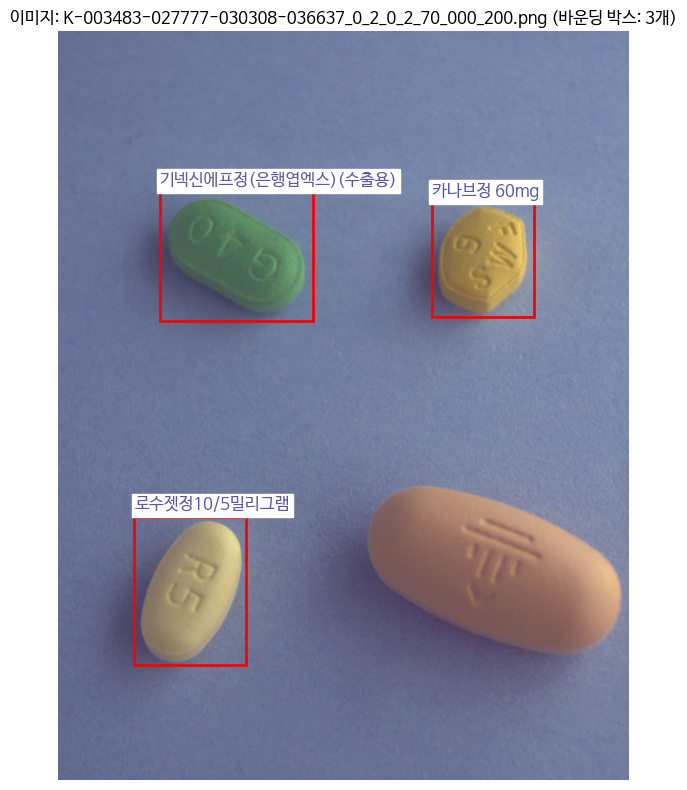

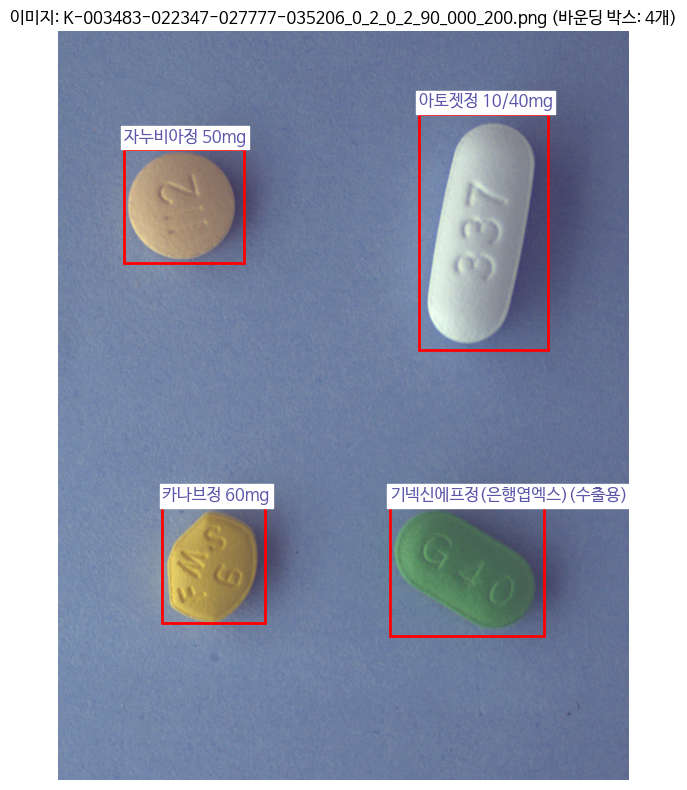

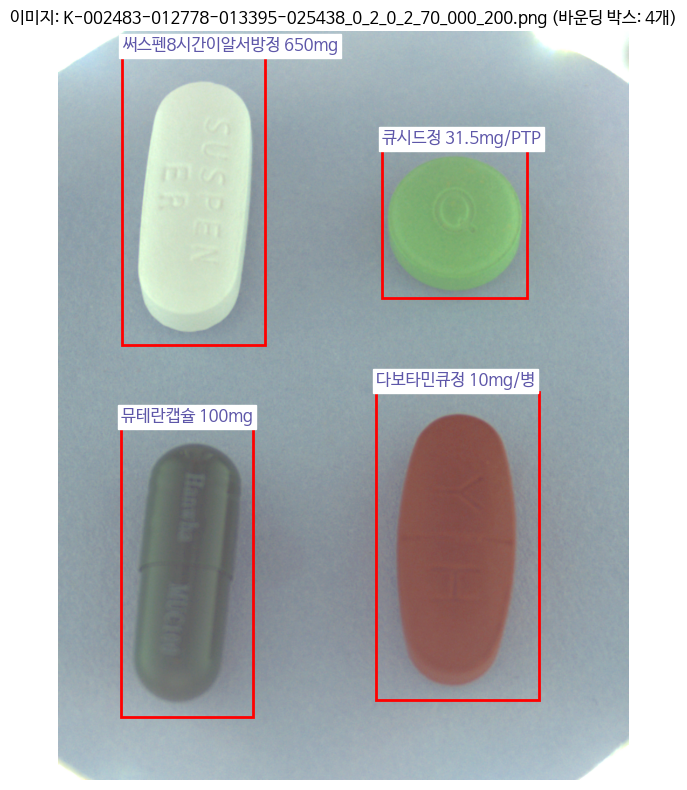

In [104]:
def visualize_pill_dataset(data_dir, json_files, num_samples=5):
    """
    json 파일로 바운딩 박스를 시각화하는 함수

    Args:
        data_dir: 이미지 파일이 있는 디렉토리 경로
        json_files: JSON 파일 경로 리스트
        num_samples: 시각화할 샘플 수 (기본값: 5)
    """
    annotations = defaultdict(list)

    # 각 JSON 파일 처리 -> dict에 [img file_name]을 key로 {어노테이션정보: [바운드박스]}뽑아서 리스트로 저장하기
    for json_path in json_files:
        with open(json_path, 'r', encoding='utf-8') as f:
            data = json.load(f)

            file_name = data['images'][0]['file_name']
            bbox = data['annotations'][0]['bbox']
            category_name = data['categories'][0]['name']

            annotations[file_name].append({category_name: bbox})

    items_list = list(annotations.items())
    random.shuffle(items_list)

    # 시각화
    for file_name, anno in items_list[:num_samples]:
        image_path = os.path.join(data_dir, file_name)
        img = Image.open(image_path).convert("RGB")

        fig, ax = plt.subplots(1, figsize=(8, 8))
        ax.imshow(img)

        # 모든 바운딩 박스 그리기
        for a in anno:

            label = list(a.keys())[0]
            bbox = list(a.values())[0]

            x, y, width, height = bbox

            # 바운딩 박스 그리기
            rect = patches.Rectangle(
                (x, y), width, height,
                linewidth=2, edgecolor='r', facecolor='none'
            )
            ax.add_patch(rect)

            # 라벨 텍스트
            ax.text(
                x, y - 12, label,
                fontsize=12, color='#5e57a9',
                bbox=dict(facecolor='white', alpha=1, pad=2, edgecolor='White')
            )

        ax.axis('off')
        plt.title(f"이미지: {file_name} (바운딩 박스: {len(anno)}개)")
        plt.tight_layout()
        plt.show()


visualize_pill_dataset(train_dir, json_files, num_samples=5)

## bbox 좌표 확인

# Yolo용 데이터 리팩토링

In [84]:
# 새 YOLO용 경로
yolo_root = os.path.join(data_dir, 'data_yolo')
img_train_dir = os.path.join(yolo_root, 'images/train')
img_val_dir = os.path.join(yolo_root, 'images/val')

label_root = os.path.join(yolo_root, 'labels')
lbl_train_dir = os.path.join(label_root, 'train')
lbl_val_dir = os.path.join(label_root, 'val')

for d in [img_train_dir, img_val_dir, lbl_train_dir, lbl_val_dir]:
    os.makedirs(d, exist_ok=True)

In [150]:
# 전역 class_map (name → id)
class_map = {}
class_counter = 0
for jf in json_files:
    with open(jf, 'r', encoding='utf-8') as f:
        data = json.load(f)
    for cat in data.get('categories', []):
        name = cat['name']
        if name not in class_map:
            class_map[name] = class_counter
            class_counter += 1

inverse_class_map = {v: k for k, v in class_map.items()}

print('클래스 개수:', len(class_map))

클래스 개수: 73


In [72]:
# 이미지별 json 묶기
img2json = defaultdict(list)
for jf in json_files:
    with open(jf, 'r', encoding='utf-8') as f:
        data = json.load(f)
    img_name = data['images'][0]['file_name']
    img2json[img_name].append(jf)
print('총 이미지 개수:', len(img2json))

총 이미지 개수: 1489


In [73]:
def convert_jsons_to_txt(json_list, save_dir, class_map):
    '''
    YOLO txt 변환 함수
    '''
    if not json_list: return None
    with open(json_list[0], 'r', encoding='utf-8') as f:
        first_data = json.load(f)
    img = first_data['images'][0]
    img_w, img_h = img['width'], img['height']
    img_name = img['file_name']
    label_path = os.path.join(save_dir, img_name.replace('.png', '.txt'))

    yolo_lines = []
    for jf in json_list:
        with open(jf, 'r', encoding='utf-8') as f:
            data = json.load(f)
        id2name = {cat['id']: cat['name'] for cat in data['categories']}
        for ann in data['annotations']:
            if 'bbox' not in ann or len(ann['bbox']) != 4:
                continue
            x, y, w, h = ann['bbox']
            x_center = (x + w / 2) / img_w
            y_center = (y + h / 2) / img_h
            w /= img_w
            h /= img_h

            cat_id = ann['category_id']
            if cat_id not in id2name:
                continue
            name = id2name[cat_id]
            if name not in class_map:
                continue
            cls_id = class_map[name]

            yolo_lines.append(f'{cls_id} {x_center} {y_center} {w} {h}')

    if yolo_lines:
        with open(label_path, 'w', encoding='utf-8') as f:
            f.write('\n'.join(yolo_lines) + '\n')
    return img_name

In [74]:
# 학습/검증 데이터 분할
images = list(img2json.keys())
random.shuffle(images)
split_idx = int(len(images) * 0.8)
train_imgs, val_imgs = images[:split_idx], images[split_idx:]

print('Train 이미지:', len(train_imgs))
print('Val 이미지:', len(val_imgs))

Train 이미지: 1191
Val 이미지: 298


In [77]:
# 변환 및 심볼릭 링크 생성
def symlink(src, dst):
    system = platform.system()

    try:
        if system == 'Windows':
            import subprocess
            subprocess.call(['mklink', '/D', dst, src], shell=True)
        else:  # Unix, Linux, MacOS
            import os
            os.symlink(src, dst)

    except Exception as e:
        print(f"심볼릭 링크 생성 중 오류 발생: {e}")


# train set
for img_name in train_imgs:
    img_src = os.path.join(train_dir, img_name)
    img_dst = os.path.join(img_train_dir, img_name)
    if not os.path.exists(img_dst):
        try:
            symlink(img_src, img_dst)
        except:
            shutil.copy(img_src, img_dst)  # fallback
    convert_jsons_to_txt(img2json[img_name], lbl_train_dir, class_map)

# val set
for img_name in val_imgs:
    img_src = os.path.join(train_dir, img_name)
    img_dst = os.path.join(img_val_dir, img_name)
    if not os.path.exists(img_dst):
        try:
            symlink(img_src, img_dst)
        except:
            shutil.copy(img_src, img_dst)  # fallback
    convert_jsons_to_txt(img2json[img_name], lbl_val_dir, class_map)


print('YOLO data_yolo 준비 완료')
print('data_yolo/images/train:', len(os.listdir(img_train_dir)))
print('data_yolo/labels/train:', len(os.listdir(lbl_train_dir)))
print('data_yolo/images/val:', len(os.listdir(img_val_dir)))
print('data_yolo/labels/val:', len(os.listdir(lbl_val_dir)))

YOLO data_yolo 준비 완료
data_yolo/images/train: 1191
data_yolo/labels/train: 1191
data_yolo/images/val: 298
data_yolo/labels/val: 298


In [85]:
class_ids = set()

for split in ['train', 'val']:
    split_dir = os.path.join(label_root, split)
    for f in os.listdir(split_dir):
        if f.endswith('.txt'):
            with open(os.path.join(split_dir, f), 'r', encoding='utf-8') as ftxt:
                for line in ftxt:
                    cls_id = int(line.split()[0])
                    class_ids.add(cls_id)

print('클래스 개수:', len(class_ids))
print('클래스 ID 목록:', sorted(class_ids))

클래스 개수: 73
클래스 ID 목록: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72]


In [81]:
yaml_path = '/configs/yolo_data.yaml'

data_yaml = {
    'train': img_train_dir,
    'val': img_val_dir,
    'nc': len(class_map),
    'names': [name for name, _ in sorted(class_map.items(), key=lambda x: x[1])]
}

with open(yaml_path, 'w', encoding='utf-8') as f:
    yaml.dump(data_yaml, f, allow_unicode=True)

print(f'yaml 저장 완료 → {yaml_path}')

yaml 저장 완료 → /content/configs/yolo_data.yaml


- 기본 증강(rotation, horizon, mixup, mosaic 등) -> model.train()에서 가능
- 데이터셋 확장하는 방법

# 데이터 전처리

## bbox 크기

In [89]:
def check_all_labels(label_dir):
    """
    모든 레이블 파일을 검사하여 좌표값이 0~1 범위를 벗어나는지 확인합니다.

    Args:
        label_dir: 레이블 파일이 있는 디렉토리 경로
    """
    invalid_labels = []

    # 레이블 파일 목록 가져오기
    label_files = [f for f in os.listdir(label_dir) if f.endswith('.txt')]

    for label_file in label_files:
        label_path = os.path.join(label_dir, label_file)

        # 레이블 파일 읽기
        with open(label_path, 'r') as f:
            labels = f.readlines()

        for line_num, label in enumerate(labels, 1):
            parts = label.strip().split()
            if len(parts) == 5:
                try:
                    class_id = int(parts[0])
                    x_center = float(parts[1])
                    y_center = float(parts[2])
                    width = float(parts[3])
                    height = float(parts[4])

                    # 좌표가 0~1 범위를 벗어나는지 확인
                    if (x_center < 0 or x_center > 1 or
                        y_center < 0 or y_center > 1 or
                        width < 0 or width > 1 or
                        height < 0 or height > 1):
                        invalid_labels.append((label_file, line_num, class_id, x_center, y_center, width, height))
                except ValueError:
                    # 숫자로 변환할 수 없는 경우
                    invalid_labels.append((label_file, line_num, "형식 오류", parts))
            else:
                # 형식이 맞지 않는 경우 (항목이 5개가 아님)
                invalid_labels.append((label_file, line_num, "항목 수 오류", parts))

    # 결과 출력
    if invalid_labels:
        print(f"=== 잘못된 형식의 레이블 ({len(invalid_labels)}개 발견) ===")
        for label_file, line_num, *error_info in invalid_labels:
            print(f"파일: {label_file}, 라인: {line_num}, 오류: {error_info}")
        return invalid_labels
    else:
        print("모든 레이블이 올바른 형식입니다.")
        return []

# 사용 예시
invalid_boxes = check_all_labels(lbl_train_dir)
invalid_boxes = check_all_labels(lbl_val_dir)

=== 잘못된 형식의 레이블 (1개 발견) ===
파일: K-003544-004543-012247-016551_0_2_0_2_70_000_200.txt, 라인: 1, 오류: [0, 0.7802254098360656, 7.029296875, 0.2223360655737705, 0.16953125]
=== 잘못된 형식의 레이블 (1개 발견) ===
파일: K-003351-016262-018357_0_2_0_2_75_000_200.txt, 라인: 3, 오류: [65, 6.88780737704918, 0.611328125, 0.31864754098360654, 0.24609375]


## bbox 잘못된 좌표

In [90]:
def check_overlapping_boxes(label_dir, iou_threshold=0.5):
    """
    같은 이미지 내에서 바운딩 박스끼리 겹침이 있는지 확인합니다.

    Args:
        label_dir: 레이블 파일이 있는 디렉토리 경로
        iou_threshold: 겹침으로 판단할 IoU 임계값 (기본값: 0.5)
    """
    overlapping_boxes = []

    # 레이블 파일 목록 가져오기
    label_files = [f for f in os.listdir(label_dir) if f.endswith('.txt')]

    for label_file in label_files:
        label_path = os.path.join(label_dir, label_file)

        # 레이블 파일 읽기
        with open(label_path, 'r') as f:
            labels = f.readlines()

        boxes = []
        for line in labels:
            parts = line.strip().split()
            if len(parts) == 5:
                try:
                    class_id = int(parts[0])
                    x_center = float(parts[1])
                    y_center = float(parts[2])
                    width = float(parts[3])
                    height = float(parts[4])

                    # YOLO 형식(x_center, y_center, width, height)에서
                    # 좌표 형식(x1, y1, x2, y2)으로 변환
                    x1 = x_center - width / 2
                    y1 = y_center - height / 2
                    x2 = x_center + width / 2
                    y2 = y_center + height / 2

                    boxes.append((class_id, x1, y1, x2, y2))
                except ValueError:
                    continue

        # 같은 이미지 내의 모든 바운딩 박스 쌍에 대해 IoU 계산
        for i in range(len(boxes)):
            for j in range(i+1, len(boxes)):
                box1 = boxes[i]
                box2 = boxes[j]

                # IoU 계산
                # 두 박스의 교집합 영역
                x_left = max(box1[1], box2[1])
                y_top = max(box1[2], box2[2])
                x_right = min(box1[3], box2[3])
                y_bottom = min(box1[4], box2[4])

                # 교집합 영역이 있는지 확인
                if x_right > x_left and y_bottom > y_top:
                    intersection_area = (x_right - x_left) * (y_bottom - y_top)

                    # 각 박스의 면적
                    box1_area = (box1[3] - box1[1]) * (box1[4] - box1[2])
                    box2_area = (box2[3] - box2[1]) * (box2[4] - box2[2])

                    # IoU 계산
                    union_area = box1_area + box2_area - intersection_area
                    iou = intersection_area / union_area

                    # 임계값 이상이면 겹침으로 판단
                    if iou >= iou_threshold:
                        overlapping_boxes.append((
                            label_file,
                            box1[0], # class_id 1
                            box2[0], # class_id 2
                            iou,
                            (box1[1], box1[2], box1[3], box1[4]),
                            (box2[1], box2[2], box2[3], box2[4])
                        ))

    # 결과 출력
    if overlapping_boxes:
        print(f"=== 겹치는 바운딩 박스 ({len(overlapping_boxes)}개 발견) ===")
        for file, class1, class2, iou, box1, box2 in overlapping_boxes:
            print(f"파일: {file}, 클래스: {class1}와 {class2}, IoU: {iou:.4f}")
        return overlapping_boxes
    else:
        print("겹치는 바운딩 박스가 없습니다.")
        return []

# 사용 예시
overlapping_boxes = check_overlapping_boxes(lbl_train_dir, iou_threshold=0.5)

=== 겹치는 바운딩 박스 (5개 발견) ===
파일: K-001900-016548-019607-033009_0_2_0_2_70_000_200.txt, 클래스: 1와 2, IoU: 1.0000
파일: K-003351-018147-020238_0_2_0_2_90_000_200.txt, 클래스: 24와 14, IoU: 1.0000
파일: K-003351-003832-029667_0_2_0_2_90_000_200.txt, 클래스: 52와 17, IoU: 1.0000
파일: K-003351-029667-031863_0_2_0_2_70_000_200.txt, 클래스: 24와 25, IoU: 1.0000
파일: K-003351-020238-031863_0_2_0_2_70_000_200.txt, 클래스: 24와 14, IoU: 1.0000


In [158]:
overlapping_boxes = check_overlapping_boxes(lbl_val_dir, iou_threshold=0.5)

겹치는 바운딩 박스가 없습니다.


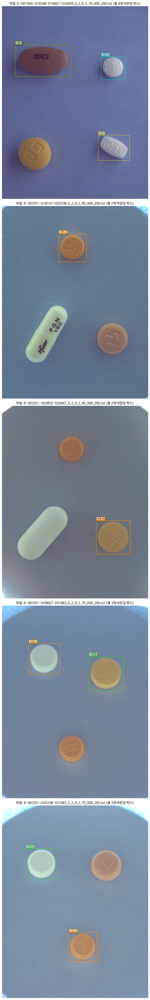

In [137]:
def visualize_specific_overlapping_boxes(image_dir, label_dir, overlapping_label_filenames):
    """
    제공된 레이블 파일 이름 목록에 해당하는 이미지와 바운딩 박스를 시각화합니다.

    Args:
        image_dir: 이미지 파일이 있는 디렉토리 경로 (예: 'path/to/your/images')
        label_dir: 레이블 파일이 있는 디렉토리 경로 (예: 'path/to/your/labels')
        overlapping_label_filenames: 시각화할 레이블 파일 이름 리스트 (예: ['K-001900-....txt', ...])
    """

    num_files = len(overlapping_label_filenames)
    if num_files == 0:
        print("시각화할 파일이 없습니다. 목록을 다시 확인해주세요.")
        return

    # 서브플롯 개수를 동적으로 설정
    fig, axes = plt.subplots(num_files, 1, figsize=(8, 10 * num_files))

    # 파일이 하나일 경우 axes가 배열이 아닌 단일 객체로 반환될 수 있으므로 리스트로 감싸줍니다.
    if num_files == 1:
        axes = [axes]

    for idx, label_filename in enumerate(overlapping_label_filenames):
        # 이미지 파일 이름 유추 (레이블 파일 이름에서 확장자만 변경)
        # 일반적인 이미지 확장자를 고려하여 `.jpg`, `.png`, `.jpeg` 순으로 시도합니다.
        base_filename = os.path.splitext(label_filename)[0]
        img_found = False
        img_path = None
        for ext in ['.jpg', '.png', '.jpeg']:
            test_img_path = os.path.join(image_dir, base_filename + ext)
            if os.path.exists(test_img_path):
                img_path = test_img_path
                img_found = True
                break

        if not img_found:
            axes[idx].set_title(f"오류: '{base_filename}'에 해당하는 이미지 파일을 찾을 수 없습니다.", color='red')
            axes[idx].axis('off')
            continue

        label_path = os.path.join(label_dir, label_filename)

        # 이미지 로드
        img = cv2.imread(img_path)
        if img is None:
            axes[idx].set_title(f"오류: '{img_path}' 이미지를 로드할 수 없습니다.", color='red')
            axes[idx].axis('off')
            continue

        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        h, w, _ = img.shape

        # 레이블 파일 로드
        if not os.path.exists(label_path):
            axes[idx].imshow(img)
            axes[idx].set_title(f"'{label_filename}' - 레이블 파일을 찾을 수 없습니다.")
            axes[idx].axis('off')
            continue

        with open(label_path, 'r') as f:
            labels = f.readlines()

        axes[idx].imshow(img)
        axes[idx].set_title(f"파일: {label_filename} (총 {len(labels)}개 바운딩 박스)")
        axes[idx].axis('off') # 축 정보 숨기기

        # 각 바운딩 박스 그리기
        for line_num, label_line in enumerate(labels):
            parts = label_line.strip().split()
            if len(parts) == 5:
                try:
                    class_id = int(parts[0])
                    x_center_norm = float(parts[1])
                    y_center_norm = float(parts[2])
                    width_norm = float(parts[3])
                    height_norm = float(parts[4])

                    # 정규화된 좌표를 실제 픽셀 좌표로 변환
                    x_center = x_center_norm * w
                    y_center = y_center_norm * h
                    bbox_width = width_norm * w
                    bbox_height = height_norm * h

                    # 바운딩 박스의 좌상단 좌표
                    x1 = int(x_center - bbox_width / 2)
                    y1 = int(y_center - bbox_height / 2)

                    # 겹치는 바운딩 박스를 더 명확하게 시각화하기 위해
                    # 각 박스에 고유한 색상 또는 패턴을 적용할 수 있습니다.
                    # 여기서는 간단하게 선의 두께와 투명도를 조절해봅니다.

                    # 무작위 색상 대신 예측 가능한 색상을 사용 (겹쳐도 알아보기 쉽게)
                    colors = plt.cm.get_cmap('hsv', 256) # 256가지 색상 맵
                    color = colors(line_num * 40 % 256) # 인덱스에 따라 다른 색상 부여

                    rect = plt.Rectangle((x1, y1), bbox_width+line_num, bbox_height+line_num,
                                         fill=False, edgecolor=color, linewidth=2 , alpha=0.4)
                    axes[idx].add_patch(rect)
                    axes[idx].text(x1, y1 - 5, f"ID:{class_id}",
                                 color='white', fontsize=13,
                                 bbox=dict(facecolor=color, alpha=0.3, pad=0.5))
                except ValueError:
                    axes[idx].text(10, 30 + line_num*20, f"레이블 파싱 오류 (라인 {line_num+1})", color='yellow', fontsize=10, backgroundcolor='red')
            else:
                axes[idx].text(10, 30 + line_num*20, f"레이블 형식 오류 (라인 {line_num+1}, {len(parts)}개 항목)", color='yellow', fontsize=10, backgroundcolor='red')

    plt.tight_layout()
    plt.show()




overlapping_boxes_filenames = [item[0] for item in overlapping_boxes]


visualize_specific_overlapping_boxes(img_train_dir, lbl_train_dir, overlapping_boxes_filenames)

- K-001900-016548-019607-033009_0_2_0_2_70_000_200
    - (1:'가바토파정 100mg', 2:'신바로정')
    - 1번 클래스가 잘못됨
- K-003351-018147-020238_0_2_0_2_90_000_200
    - (24:'일양하이트린정 2mg', 14:'플라빅스정 75mg')
    - 14번 클래스가 잘못됨
- K-003351-003832-029667_0_2_0_2_90_000_200
    - (52:'뉴로메드정(옥시라세탐)', 17:'리바로정 4mg')
    - 52번 클래스가 잘못됨
- K-003351-029667-031863_0_2_0_2_70_000_200
    - (24:'일양하이트린정 2mg', 25:'아질렉트정(라사길린메실산염)')
    - 24번 클래스가 잘못됨
- K-003351-020238-031863_0_2_0_2_70_000_200
    - (24:'일양하이트린정 2mg', 14:'플라빅스정 75mg')
    - 14번 클래스가 잘못됨


|파일명	삭제할 클래스| ID|
|---|---|
|K-001900-016548-019607-033009_0_2_0_2_70_000_200.txt|	1|
|K-003351-018147-020238_0_2_0_2_90_000_200.txt|	14|
|K-003351-003832-029667_0_2_0_2_90_000_200.txt|	52|
|K-003351-029667-031863_0_2_0_2_70_000_200.txt|	24|
|K-003351-020238-031863_0_2_0_2_70_000_200.txt|	14|

In [156]:
# 삭제할 클래스 ID가 있는 파일과 클래스 정보 딕셔너리
files_to_fix = {
    'K-001900-016548-019607-033009_0_2_0_2_70_000_200.txt': {1},
    'K-003351-018147-020238_0_2_0_2_90_000_200.txt': {14},
    'K-003351-003832-029667_0_2_0_2_90_000_200.txt': {52},
    'K-003351-029667-031863_0_2_0_2_70_000_200.txt': {24},
    'K-003351-020238-031863_0_2_0_2_70_000_200.txt': {14},
}

for filename, classes_to_remove in files_to_fix.items():
    path = os.path.join(lbl_train_dir, filename)

    if not os.path.exists(path):
        print(f"파일이 존재하지 않습니다: {filename}")
        continue

    with open(path, 'r') as f:
        lines = f.readlines()

    # 삭제할 클래스 ID를 가진 라인 제외
    filtered_lines = [line for line in lines if int(line.strip().split()[0]) not in classes_to_remove]

    # 수정된 내용으로 파일 덮어쓰기
    with open(path, 'w') as f:
        f.writelines(filtered_lines)

    print(f"완료: {filename} 에서 클래스 {classes_to_remove} 라인 삭제함")

완료: K-001900-016548-019607-033009_0_2_0_2_70_000_200.txt 에서 클래스 {1} 라인 삭제함
완료: K-003351-018147-020238_0_2_0_2_90_000_200.txt 에서 클래스 {14} 라인 삭제함
완료: K-003351-003832-029667_0_2_0_2_90_000_200.txt 에서 클래스 {52} 라인 삭제함
완료: K-003351-029667-031863_0_2_0_2_70_000_200.txt 에서 클래스 {24} 라인 삭제함
완료: K-003351-020238-031863_0_2_0_2_70_000_200.txt 에서 클래스 {14} 라인 삭제함


In [157]:
overlapping_boxes = check_overlapping_boxes(lbl_train_dir, iou_threshold=0.5)

겹치는 바운딩 박스가 없습니다.
